In [1]:
import pymongo
import re
import pandas as pd
from datetime import datetime
import pprint
from collections import Counter

from utils.text_editing import edit_text

import matplotlib.pyplot as plt

import geopandas as gpd
import folium
from shapely.geometry import mapping, Point, Polygon
from shapely import wkt


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\vrace\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\vrace\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\vrace\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


# Twitter

Twitter query has been done on the server with Twitter Archive from Geo Social Analytics Lab

```
CREATE TABLE nikola.hurricane_ian
TABLESPACE extern_hard_disc 
AS 
SELECT * 
FROM archive.twitter 
WHERE "date" > '2022-09-14' 
  AND "date" < '2022-10-16' 
  AND ST_Contains(
        ST_GeomFromText('POLYGON((-87.634643 24.396308, -87.634643 31.000888, -79.974306 31.000888, -79.974306 24.396308, -87.634643 24.396308))', 4326),
        geom
      );
```

skipped 18,103 bad lines

In [152]:
df = pd.read_csv("datasets/tweets_hurricane_ian_2022.tsv",sep="\t", usecols = ['message_id', 'date', 'text', 'geom'],  on_bad_lines='warn')
df['date'] = pd.to_datetime(df['date'])
_len = len(df)
print(f'Number of tweets: {_len}')
df.drop_duplicates(subset=['message_id'], inplace=True) # id field is the tiktok id
print(f"Number of removed duplicates: {_len - len(df)}")
df.head(1)

Number of tweets: 1188171
Number of removed duplicates: 0


,message_id,date,text,geom
0,1569475953306533889,2022-09-13 00:00:01,"Pick three? Mine are broccoli ,radish ,Brussel...","POLYGON ((-80.150642 25.93737, -80.150642 25.9..."


In [181]:
start_date = pd.Timestamp('2022-09-20')  # Inclusive start date
end_date = pd.Timestamp('2022-10-10')    # Inclusive end date
filtered_df = df[(df['date'] >= start_date) & (df['date'] <= end_date)]
print(f"Number of tweets from 20 Sept to 10 Oct {len(filtered_df)}")

Number of tweets from 20 Sept to 10 Oct 704342


In [182]:
filtered_df['text'] = filtered_df['text'].fillna('')
# Keywords to filter for
keywords = ["Hurricane", "#Hurricane",]
pattern = "|".join(keywords)
regex = re.compile(pattern, re.IGNORECASE)
filtered_df = filtered_df[filtered_df['text'].str.contains(regex)]
print(f"Number of tweets containing 'Hurricane': {len(filtered_df)}")

C:\Users\vrace\AppData\Local\Temp\ipykernel_2420\315498157.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['text'] = filtered_df['text'].fillna('')


Number of tweets containing 'Hurricane': 13531


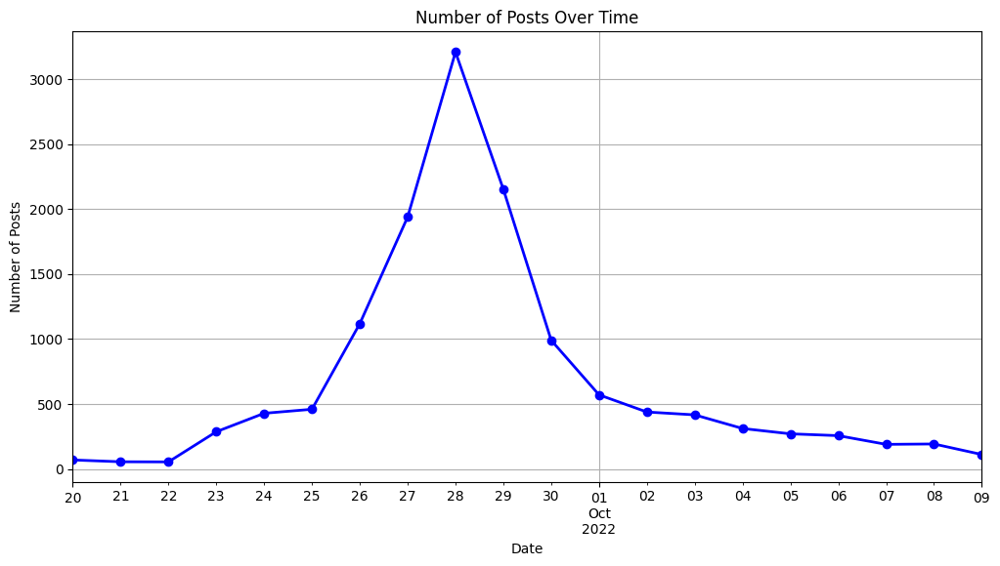

In [180]:
# filtered_df.set_index('date', inplace=True)
# posts_count = filtered_df.resample('D').size()
# plt.figure(figsize=(12, 6))
# posts_count.plot(kind='line', color='b', marker='o', linestyle='-', linewidth=2)
# plt.title('Number of Posts Over Time')
# plt.xlabel('Date')
# plt.ylabel('Number of Posts')
# plt.grid(True)
# plt.show()

In [183]:
# Let's remove some tags
word_counts = Counter()
for text in filtered_df['text']:
    words = text.split()
    word_counts.update(words)

for word, count in word_counts.most_common(100):
    print(f'{word}: {count}')

the: 8947
to: 7203
a: 5275
and: 4859
in: 4606
of: 4456
hurricane: 3618
#HurricaneIan: 3503
is: 3474
for: 3332
Hurricane: 3164
I: 3021
on: 2100
this: 1958
are: 1827
my: 1762
you: 1633
Ian: 1618
from: 1508
be: 1484
Florida: 1477
with: 1428
it: 1296
have: 1285
that: 1278
at: 1262
we: 1217
The: 1096
as: 1048
all: 1036
out: 1033
our: 1014
was: 983
will: 969
but: 929
We: 866
&: 847
by: 838
not: 797
up: 756
so: 751
get: 725
like: 688
about: 683
just: 682
has: 668
me: 662
after: 658
#hurricaneian: 649
your: 648
This: 626
@: 604
storm: 604
here: 591
or: 586
been: 573
now: 557
I’m: 528
during: 525
can: 513
power: 501
Ian.: 482
#Ian: 481
if: 478
#Florida: 468
us: 462
some: 453
people: 447
through: 445
back: 433
still: 432
no: 430
safe: 430
who: 426
hurricane.: 426
A: 418
help: 418
they: 411
know: 406
hit: 400
going: 400
before: 399
#Hurricane: 396
one: 395
when: 386
-: 384
time: 382
what: 374
got: 371
do: 369
🌀: 368
down: 360
had: 353
an: 353
their: 348
go: 347
My: 346
more: 339
over: 337
how: 33

In [184]:
filtered_df['edited_text'] =  filtered_df['text'].apply(lambda x: edit_text(str(x), stoplist=[], min_length_word=1,remove_links=True, remove_user_names=True,remove_emojis=True, letters_only=True))


In [185]:
# Let's remove some tags
word_counts = Counter()
for text in filtered_df['edited_text']:
    words = text.split()
    word_counts.update(words)

for word, count in word_counts.most_common(100):
    print(f'{word}: {count}')

the: 10194
hurricane: 8751
to: 7535
and: 5206
in: 5026
hurricaneian: 4727
of: 4598
is: 3686
ian: 3595
for: 3551
florida: 2917
this: 2748
it: 2627
we: 2618
you: 2341
on: 2282
my: 2139
are: 2018
that: 1657
be: 1648
from: 1590
with: 1519
at: 1415
all: 1413
have: 1411
out: 1277
as: 1224
our: 1216
but: 1115
will: 1055
so: 1050
storm: 1049
was: 1031
now: 1009
not: 1004
here: 961
just: 938
up: 920
by: 912
me: 869
can: 850
get: 847
if: 819
after: 774
like: 766
about: 731
us: 725
no: 717
they: 714
your: 709
safe: 700
power: 694
has: 694
hurricanes: 668
or: 629
help: 627
been: 618
there: 607
what: 607
tampa: 591
people: 586
during: 561
some: 553
one: 550
re: 543
time: 531
still: 523
back: 514
when: 513
hit: 512
who: 506
fl: 499
through: 498
today: 498
please: 495
need: 488
before: 483
do: 475
going: 469
go: 467
know: 466
how: 459
water: 455
stay: 455
am: 450
he: 447
down: 443
more: 442
day: 441
got: 439
orlando: 436
don: 435
everyone: 424
over: 404
had: 402
see: 398
an: 395
good: 386
first: 385


In [186]:
filtered_df.head()


,message_id,date,text,geom,edited_text
81,1576000542165585920,2022-10-01 00:06:24,Check out these before/after pictures of the #...,"POLYGON ((-81.895498 26.564625, -81.895498 26....",check out these before after pictures of the s...
84,1576000606493638656,2022-10-01 00:06:39,@swersey Out of the 22 million residents of Fl...,"POLYGON ((-80.177525 26.879058, -80.177525 26....",out of the million residents of florida of whi...
174,1576002234634018816,2022-10-01 00:13:08,Friday night on the Space Coast: A couple watc...,"POLYGON ((-80.706074 28.03509, -80.706074 28.2...",friday night on the space coast couple watches...
302,1576000125205291009,2022-10-01 00:04:45,Thank you for the thoughts & well wishes. Fort...,"POLYGON ((-82.712772 27.977811, -82.712772 28....",thank you for the thoughts well wishes fortuna...
392,1576002053536509952,2022-10-01 00:12:24,So much flooding from #Hurricane #Ian it looks...,"POLYGON ((-81.404008 28.356049, -81.404008 28....",so much flooding from hurricane ian it looks l...


In [189]:
twitter_df_with_geom = filtered_df.copy()
twitter_df_with_geom.rename(columns={'message_id': 'id'}, inplace=True)
twitter_df_with_geom.head()
# save georeferenced
twitter_df_with_geom.to_csv("datasets/twitter_df_with_geom.csv")

twitter_df = twitter_df_with_geom[['date', 'id', 'text', 'edited_text']]
twitter_df['date'] = pd.to_datetime(twitter_df['date'])

# Define the order of columns
order = ['id', 'date', 'text', 'edited_text']
twitter_df = twitter_df[order]
twitter_df["source"] = "Twitter"


C:\Users\vrace\AppData\Local\Temp\ipykernel_2420\2788689382.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  twitter_df['date'] = pd.to_datetime(twitter_df['date'])


In [176]:
filtered_df.columns

Index(['level_0', 'index', 'date', 'message_id', 'text', 'geom',
       'edited_text'],
      dtype='object')

In [205]:
twitter_df.head()

,id,date,text,edited_text,source
81,1576000542165585920,2022-10-01 00:06:24,Check out these before/after pictures of the #...,check out these before after pictures of the s...,Twitter
84,1576000606493638656,2022-10-01 00:06:39,@swersey Out of the 22 million residents of Fl...,out of the million residents of florida of whi...,Twitter
174,1576002234634018816,2022-10-01 00:13:08,Friday night on the Space Coast: A couple watc...,friday night on the space coast couple watches...,Twitter
302,1576000125205291009,2022-10-01 00:04:45,Thank you for the thoughts & well wishes. Fort...,thank you for the thoughts well wishes fortuna...,Twitter
392,1576002053536509952,2022-10-01 00:12:24,So much flooding from #Hurricane #Ian it looks...,so much flooding from hurricane ian it looks l...,Twitter


In [204]:
twitter_df["source"] = "Twitter"


### Make points from georeferenced twitter data for further comparison as independent dataset

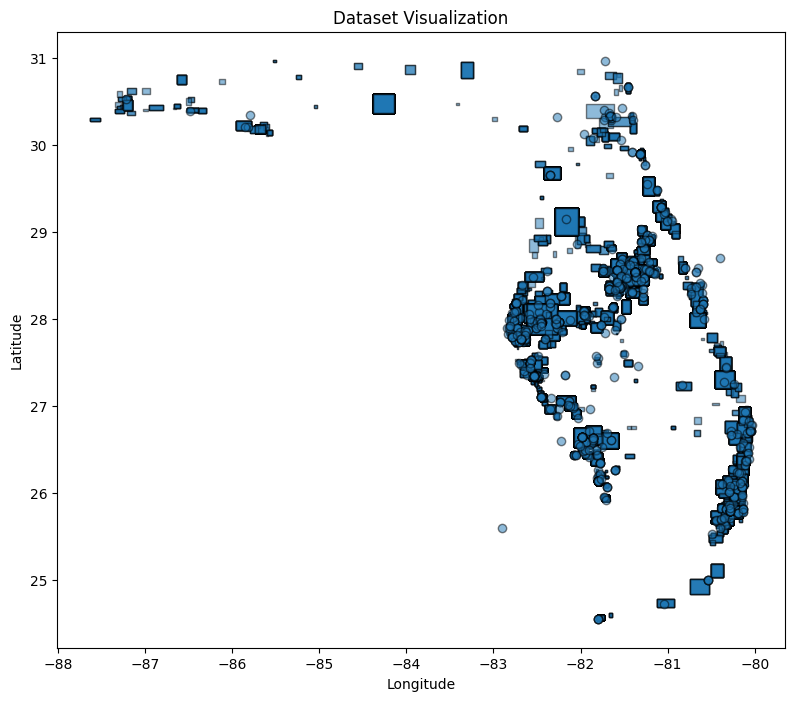

In [31]:

df = pd.read_csv("datasets/twitter_df_with_geom.csv")
df['geometry'] = df['geom'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(df, geometry="geometry")
# Plot the polygons and points
fig, ax = plt.subplots(figsize=(10, 8))
gdf.plot(ax=ax, alpha=0.5, edgecolor='k') 
ax.set_title('Dataset Visualization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [32]:
# Make folium map
df['geometry'] = df['geom'].apply(wkt.loads)
gdf = gpd.GeoDataFrame(df, geometry='geometry')

gdf.crs = 'EPSG:4326'
gdf_json = gdf.to_json()
centroid = gdf.unary_union.centroid
center = [centroid.y, centroid.x]  # Folium expects [latitude, longitude]

# Create a Folium map centered on the centroid of the geometries
m = folium.Map(location=center, zoom_start=10)

# Define a style function to make polygons more transparent
def style_function(feature):
    return {
        'fillColor': '#3186cc',  # Color of the polygons
        'color': 'black',  # Outline color of the polygons
        'weight': 1,  # Outline weight of the polygons
        'fillOpacity': 0.3  # Opacity of the polygons (0 = fully transparent, 1 = fully opaque)
    }

# Add GeoJSON layer to the map with custom style (more transparent polygons)
folium.GeoJson(
    gdf_json,
    name='geojson',
    style_function=style_function
).add_to(m)

# Display the map
m


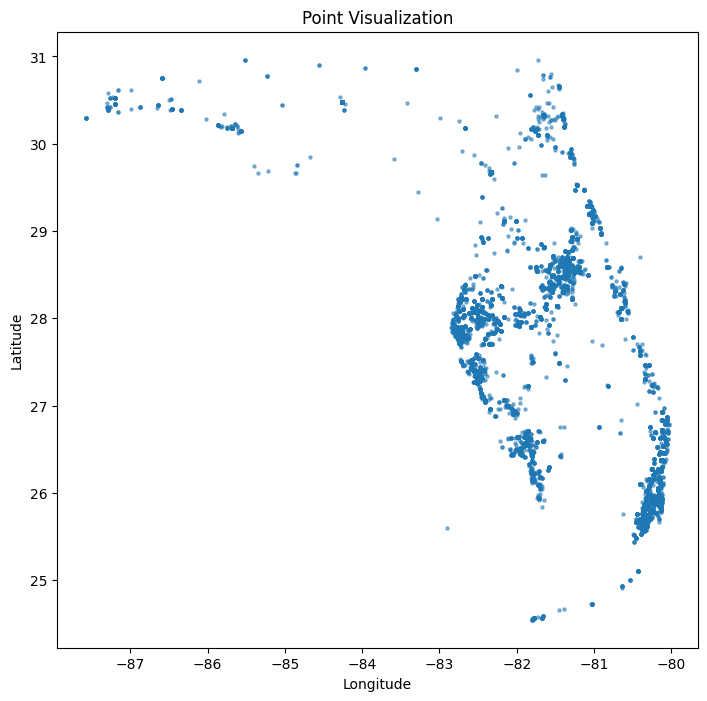

In [33]:

# Get latitude and longitude columns
from shapely.geometry import Point, Polygon

def calculate_new_geometry(geom):
    if isinstance(geom, Point):
        return geom
    elif isinstance(geom, Polygon):
        centroid = geom.centroid
        return centroid
    else:
        return None  

gdf['new_geometry'] = gdf['geometry'].apply(calculate_new_geometry)
gdf = gdf.set_geometry('new_geometry')
gdf['latitude'] = gdf['new_geometry'].apply(lambda geom: geom.y)
gdf['longitude'] = gdf['new_geometry'].apply(lambda geom: geom.x)
gdf.head()
# gdf = gdf.drop(columns=['geometry'])

fig, ax = plt.subplots(figsize=(10, 8))
gdf.plot(ax=ax, alpha=0.5, markersize=5) 
ax.set_title('Point Visualization')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


In [34]:
gdf = gdf[["id",'date', 'text', 'edited_text', 'latitude', 'longitude']]
gdf.head()
gdf.to_csv("datasets/original_georeferenced_points_twitter.csv")

In [38]:
unique_values = gdf['latitude'].unique()
print("Unique values in 'column_name':", len(unique_values))

Unique values in 'column_name': 1690


# Mastodon

Maybe using only Hurricane will do the job!?

In [ ]:
# Maybe using only Hurricane will do the job!?

In [210]:
# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["Mastodon-Ian-1509-1510"]
collection = db["toots"]
collection.create_index([
    ('created_at', pymongo.ASCENDING),
])
cursor = collection.find({}).limit(10)
for doc in cursor:
    pprint.pprint(doc)


{'_id': ObjectId('663b65e7c68ee55e315cb74b'),
 'account': {'acct': 'RRRB_F@fedibird.com',
             'avatar': 'https://files.mastodon.social/cache/accounts/avatars/106/306/241/502/228/398/original/fb2802bda6eee604.png',
             'avatar_static': 'https://files.mastodon.social/cache/accounts/avatars/106/306/241/502/228/398/original/fb2802bda6eee604.png',
             'bot': False,
             'created_at': datetime.datetime(2021, 5, 27, 0, 0),
             'discoverable': True,
             'display_name': 'れるらば(Fedibird)',
             'emojis': [],
             'fields': [{'name': 'RailsimPI公開サイト',
                         'value': '<a '
                                  'href="http://jyouban6101.wixsite.com/reruraba-rs" '
                                  'rel="nofollow noopener noreferrer" '
                                  'target="_blank"><span '
                                  'class="invisible">http://</span><span '
                                  'class="ellipsis">

In [211]:
# Start and end date with midnight time
start_date = datetime.strptime('2022-09-20', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
end_date = datetime.strptime('2022-10-10', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)

# Construct query to find documents within the date range
query = {
    "created_at": {
        "$gte": start_date,
        "$lte": end_date
    }
}
projection = {
    "_id": 1,
}
cursor = collection.find(query,projection)
print(f"Total number of documents: {len(list(cursor))}")


Total number of documents: 1068618


In [212]:
# Keywords
keywords = ["Hurricane"] #, "Hurricane Ian", "HurricaneIan", "HurricaneIan2022"]

# Regex pattern
pattern = "|".join(keywords)
regex = re.compile(pattern, re.IGNORECASE)

# Query
query = {
    "created_at": {
        "$gte": start_date,
        "$lte": end_date
    },
    "content": {"$regex": regex},
}
projection = {
    "_id":0,
    "id": 1,
    "created_at":1,
    "content":1,
}
cursor = collection.find(query,projection)
df = pd.DataFrame(cursor)
_len = len(df)
df.drop_duplicates(subset=['id'], inplace=True)
print(f"Number of removed duplicates: {_len - len(df)}")
print(f"Total filtered posts {len(df)}")
df.head(1)

Number of removed duplicates: 0
Total filtered posts 902


,id,created_at,content
0,109027835372232905,2022-09-20 00:12:21,<p>Opening Icon comms for charity! I'm gonna b...


In [213]:
df['edited_text'] = df['content'].apply(lambda x: edit_text(str(x), stoplist=[], min_length_word=1,remove_links=True, remove_user_names=True,remove_emojis=True, letters_only=True))


In [214]:
# Let's remove some tags
word_counts = Counter()
for text in df['edited_text']:
    words = text.split()
    word_counts.update(words)

for word, count in word_counts.most_common(100):
    print(f'{word}: {count}')

span: 6467
class: 3322
href: 1901
rel: 1898
target: 1557
blank: 1557
nofollow: 1557
noopener: 1557
noreferrer: 1557
invisible: 1496
the: 1274
hurricane: 1202
hashtag: 1005
mention: 1003
ian: 850
of: 713
to: 687
ellipsis: 658
and: 585
in: 577
br: 559
florida: 506
com: 482
https: 470
is: 381
tag: 341
on: 305
no: 275
for: 267
it: 263
twitter: 233
translate: 216
as: 214
storm: 209
news: 207
this: 202
from: 183
html: 179
that: 175
rt: 175
hurricanes: 174
climate: 169
with: 164
fiona: 147
are: 147
by: 139
at: 136
status: 133
amp: 132
us: 131
economist: 127
be: 126
we: 117
hurricaneian: 115
you: 113
but: 112
org: 111
have: 110
power: 109
after: 105
not: 105
people: 103
states: 99
utm: 96
change: 94
more: 93
will: 91
was: 88
category: 86
eu: 86
rico: 84
my: 84
has: 83
puerto: 82
cuba: 81
so: 79
now: 79
like: 76
out: 73
up: 73
damage: 72
coast: 72
all: 71
about: 69
an: 69
they: 69
just: 67
making: 67
if: 66
weather: 65
over: 64
landfall: 64
there: 63
can: 62
here: 61
winds: 59
water: 59
what: 5

In [215]:
additional_stopwords = ['rel',
'blank',
'span',
'class',
'href',
'target',
'nofollow',
'noopener',
'noreferrer',
'invisible',
'mention',
'hashtag',
'ellipsis',
'com',
'https',
'br',
'translate',
'tag']

In [216]:
df['edited_text'] = df['edited_text'].apply(lambda x: edit_text(str(x), stoplist=additional_stopwords, min_length_word=1,remove_links=True, remove_user_names=True,remove_emojis=True, letters_only=True))


In [217]:
# Let's remove some tags
word_counts = Counter()
for text in df['edited_text']:
    words = text.split()
    word_counts.update(words)

for word, count in word_counts.most_common(100):
    print(f'{word}: {count}')

the: 1274
hurricane: 1202
ian: 850
of: 713
to: 687
and: 585
in: 577
florida: 506
is: 381
on: 305
no: 275
for: 267
it: 263
twitter: 233
as: 214
storm: 209
news: 207
this: 202
from: 183
html: 179
that: 175
rt: 175
hurricanes: 174
climate: 169
with: 164
fiona: 147
are: 147
by: 139
at: 136
status: 133
amp: 132
us: 131
economist: 127
be: 126
we: 117
hurricaneian: 115
you: 113
but: 112
org: 111
have: 110
power: 109
after: 105
not: 105
people: 103
states: 99
utm: 96
change: 94
more: 93
will: 91
was: 88
category: 86
eu: 86
rico: 84
my: 84
has: 83
puerto: 82
cuba: 81
so: 79
now: 79
like: 76
out: 73
up: 73
damage: 72
coast: 72
all: 71
about: 69
an: 69
they: 69
just: 67
making: 67
if: 66
weather: 65
over: 64
landfall: 64
there: 63
can: 62
here: 61
winds: 59
water: 59
what: 58
statu: 58
live: 58
how: 58
into: 57
worse: 56
hit: 55
still: 54
biden: 53
url: 53
atlantic: 53
surge: 53
some: 51
before: 51
united: 50
or: 49
phys: 49
tampa: 49
quot: 47
solar: 47
relief: 46


In [218]:
mastodon_df = df.copy()
mastodon_df.head()

,id,created_at,content,edited_text
0,109027835372232905,2022-09-20 00:12:21.000,<p>Opening Icon comms for charity! I'm gonna b...,opening icon comms for charity gonna be giving...
1,109028796108075828,2022-09-20 04:16:41.561,"<p>Stay Safe Haiti, Dominican Republic, and Tu...",stay safe haiti dominican republic and turks a...
2,109028817913793712,2022-09-20 04:22:14.281,"<p>Also, stay safe the Bahamas and Bermuda &lt...",also stay safe the bahamas and bermuda lt hurr...
3,109028943149941750,2022-09-20 04:54:05.240,"<p>Der Hurrikan Fiona hat <a href=""https://mas...",der hurrikan fiona hat puertorico hart getroff...
4,109029593579635101,2022-09-20 07:39:30.004,"<p>Category 3 major Hurricane <a href=""https:/...",category major hurricane fiona lightning fille...


In [219]:
mastodon_df.rename(columns={'created_at': 'date','content':'text'}, inplace=True)
mastodon_df['date'] = pd.to_datetime(mastodon_df['date'])
# Define the order of columns
order = ['id', 'date', 'text', 'edited_text']
mastodon_df = mastodon_df[order]
mastodon_df["source"] = "Mastodon"
mastodon_df.head()

,id,date,text,edited_text,source
0,109027835372232905,2022-09-20 00:12:21.000,<p>Opening Icon comms for charity! I'm gonna b...,opening icon comms for charity gonna be giving...,Mastodon
1,109028796108075828,2022-09-20 04:16:41.561,"<p>Stay Safe Haiti, Dominican Republic, and Tu...",stay safe haiti dominican republic and turks a...,Mastodon
2,109028817913793712,2022-09-20 04:22:14.281,"<p>Also, stay safe the Bahamas and Bermuda &lt...",also stay safe the bahamas and bermuda lt hurr...,Mastodon
3,109028943149941750,2022-09-20 04:54:05.240,"<p>Der Hurrikan Fiona hat <a href=""https://mas...",der hurrikan fiona hat puertorico hart getroff...,Mastodon
4,109029593579635101,2022-09-20 07:39:30.004,"<p>Category 3 major Hurricane <a href=""https:/...",category major hurricane fiona lightning fille...,Mastodon


In [220]:
mastodon_df.head()

,id,date,text,edited_text,source
0,109027835372232905,2022-09-20 00:12:21.000,<p>Opening Icon comms for charity! I'm gonna b...,opening icon comms for charity gonna be giving...,Mastodon
1,109028796108075828,2022-09-20 04:16:41.561,"<p>Stay Safe Haiti, Dominican Republic, and Tu...",stay safe haiti dominican republic and turks a...,Mastodon
2,109028817913793712,2022-09-20 04:22:14.281,"<p>Also, stay safe the Bahamas and Bermuda &lt...",also stay safe the bahamas and bermuda lt hurr...,Mastodon
3,109028943149941750,2022-09-20 04:54:05.240,"<p>Der Hurrikan Fiona hat <a href=""https://mas...",der hurrikan fiona hat puertorico hart getroff...,Mastodon
4,109029593579635101,2022-09-20 07:39:30.004,"<p>Category 3 major Hurricane <a href=""https:/...",category major hurricane fiona lightning fille...,Mastodon


# Tiktok

We have two databases for tiktok, because first one was not alligned with the second timeframe, and due to "high" rate limits of tiktok, I decided to keep that database, and create a new one with new posts

In [91]:
# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["tiktok-ian"]
collection = db["videos"]
cursor = collection.find({}).limit(1)
for doc in cursor:
    pprint.pprint(doc)
cursor = collection.find({},{"_id":1})

print(f"Number of total posts {len(list(cursor))}")

{'_id': ObjectId('6626197546e03bbad7568829'),
 'comment_count': 1,
 'create_time': 1665014381,
 'effect_ids': ['0'],
 'hashtag_names': ['florida',
                   'fyp',
                   'ems',
                   'ttg',
                   'firstresponders',
                   'floridastrong'],
 'id': 7151182274153794859,
 'like_count': 26,
 'music_id': 6763615215318747137,
 'region_code': 'US',
 'share_count': 0,
 'username': 'i15aac',
 'video_description': 'Hurricane Ian deployment. #florida #fyp #floridastrong '
                      '#ems #ttg #firstresponders',
 'view_count': 0}
Number of total posts 178825


In [93]:
# Filter collection
keywords = ["Hurricane"] #, "Hurricane Ian", "HurricaneIan", "HurricaneIan2022"]

# Regex pattern
pattern = "|".join(keywords)
regex = re.compile(pattern, re.IGNORECASE)

# Timestamp
start_date = datetime.strptime('2022-09-20', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
end_date = datetime.strptime('2022-10-10', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
# Unix
start_timestamp = int(start_date.timestamp())
end_timestamp = int(end_date.timestamp())

# Query
query = {
    "create_time": {
        "$gte": start_timestamp,
        "$lte": end_timestamp
    },
    "video_description": {"$regex": regex},
}
projection = {
    "_id":0,
    "id":1,
    "create_time":1,
    "video_description":1,
}
cursor = collection.find(query,projection)
df = pd.DataFrame(cursor)
# Remove duplicates
_len = len(df)
df.drop_duplicates(subset=['id'], inplace=True) # id field is the tiktok id
print(f"Number of removed duplicates: {_len - len(df)}")
print(f"Filtered posts: {len(df)}")
df.head(1)



Number of removed duplicates: 218
Filtered posts: 158816


,create_time,id,video_description
0,1665014381,7151182274153794859,Hurricane Ian deployment. #florida #fyp #flori...


In [94]:
# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["tiktok-ian-2"]
collection = db["videos"]
cursor = collection.find({}).limit(1)
for doc in cursor:
    pprint.pprint(doc)
cursor = collection.find({},{"_id":1})

print(f"Number of total posts {len(list(cursor))}")

{'_id': ObjectId('66424718d839eb7c8344d7db'),
 'comment_count': 0,
 'create_time': 1665532765,
 'hashtag_names': ['duet'],
 'id': 7153408732452703534,
 'like_count': 0,
 'music_id': 7142639808198871854,
 'region_code': 'US',
 'share_count': 0,
 'username': 'ianyang0918',
 'video_description': '#duet with @ianyang0918 ',
 'view_count': 30}
Number of total posts 16870


In [95]:

# Everything as in the previous cell

# Query and projection are defined in a previous collcetion find function
cursor = collection.find(query,projection)
df2 = pd.DataFrame(cursor)
# Remove duplicates
_len = len(df2)
df2.drop_duplicates(subset=['id'], inplace=True) # id field is the tiktok id
print(f"Number of removed duplicates: {_len - len(df2)}")
print(f"Total posts: {len(df2)}")
df2.head(1)

Number of removed duplicates: 0
Total posts: 9945


,create_time,video_description,id
0,1665352778,I see who you are #FlexEveryAngle #hurricane #...,7152635676712865067


In [96]:
tiktok_df = pd.concat([df, df2], ignore_index=True)
print(len(tiktok_df))
tiktok_df.head()

168761


,create_time,id,video_description
0,1665014381,7151182274153794859,Hurricane Ian deployment. #florida #fyp #flori...
1,1665014344,7151182123620273454,Lmmfao ok this might be my favorite one I’ve d...
2,1665014340,7151182104569629995,That was in front my house when the hurricane ...
3,1665014337,7151182079475322158,#tiktokitsjustlikeabikini👙 #over18 #itsabikinn...
4,1665014307,7151181941465795883,Get Down Boy 😂😂😂 #cod #callofduty #warzone #an...


In [99]:
tiktok_df['edited_video_description'] = tiktok_df['video_description'].apply(lambda x: edit_text(str(x), stoplist=[], min_length_word=0,remove_links=True, remove_user_names=True,remove_emojis=True, letters_only=True))
tiktok_df.head()

,create_time,id,video_description,edited_video_description
0,1665014381,7151182274153794859,Hurricane Ian deployment. #florida #fyp #flori...,hurricane ian deployment florida fyp floridast...
1,1665014344,7151182123620273454,Lmmfao ok this might be my favorite one I’ve d...,lmmfao ok this might be my favorite one i ve d...
2,1665014340,7151182104569629995,That was in front my house when the hurricane ...,that was in front my house when the hurricane ...
3,1665014337,7151182079475322158,#tiktokitsjustlikeabikini👙 #over18 #itsabikinn...,tiktokitsjustlikeabikini over itsabikinnitikto...
4,1665014307,7151181941465795883,Get Down Boy 😂😂😂 #cod #callofduty #warzone #an...,get down boy cod callofduty warzone andgo over...


In [100]:
# Let's remove some tags
word_counts = Counter()
for text in tiktok_df['edited_video_description']:
    words = text.split()
    word_counts.update(words)

for word, count in word_counts.most_common(100):
    print(f'{word}: {count}')

hurricane: 114865
hurricaneian: 111261
fyp: 59937
florida: 58894
ian: 49493
the: 48490
to: 36709
and: 26406
a: 25458
in: 23851
i: 23505
for: 19953
of: 19001
is: 17267
we: 16755
my: 15337
this: 15158
it: 14323
you: 13692
hauslabsfoundation: 12090
storm: 11798
with: 11637
s: 11599
foryou: 10332
on: 10278
viral: 10267
hurricaneseason: 10230
foryoupage: 9646
are: 9487
all: 9331
be: 8627
madewithkeurigcontest: 7870
safe: 7842
t: 7767
out: 7346
so: 7307
but: 7133
from: 6921
endlessjourney: 6912
our: 6874
that: 6857
have: 6589
was: 6224
me: 6205
tampa: 6190
weather: 5861
floridacheck: 5718
just: 5633
not: 5396
at: 5079
your: 5009
here: 4976
up: 4953
fl: 4902
orlando: 4897
us: 4643
as: 4630
can: 4625
stay: 4613
like: 4521
no: 4520
everyone: 4494
help: 4471
after: 4394
get: 4201
rain: 4170
update: 4102
m: 4055
what: 4054
will: 4015
love: 3858
by: 3824
duet: 3777
before: 3774
power: 3769
fortmyers: 3747
floridalife: 3729
prayers: 3672
if: 3649
hurricanian: 3649
trending: 3590
day: 3524
when: 341

In [101]:
stop_list = [
    'foryou',
    'fyp',
    'tiktok',
    'trending',
]

In [102]:
tiktok_df['edited_video_description'] = tiktok_df['video_description'].apply(lambda x: edit_text(str(x), stoplist=stop_list, min_length_word=0,remove_links=True, remove_user_names=True,remove_emojis=True, letters_only=True))
tiktok_df.head()

,create_time,id,video_description,edited_video_description
0,1665014381,7151182274153794859,Hurricane Ian deployment. #florida #fyp #flori...,hurricane ian deployment florida floridastrong...
1,1665014344,7151182123620273454,Lmmfao ok this might be my favorite one I’ve d...,lmmfao ok this might be my favorite one i ve d...
2,1665014340,7151182104569629995,That was in front my house when the hurricane ...,that was in front my house when the hurricane ...
3,1665014337,7151182079475322158,#tiktokitsjustlikeabikini👙 #over18 #itsabikinn...,tiktokitsjustlikeabikini over itsabikinnitikto...
4,1665014307,7151181941465795883,Get Down Boy 😂😂😂 #cod #callofduty #warzone #an...,get down boy cod callofduty warzone andgo over...


In [207]:
tiktok_df.rename(columns={'create_time': 'date','video_description':'text', 'edited_video_description':'edited_text'}, inplace=True)
tiktok_df['date'] = pd.to_datetime(tiktok_df['date'])
# Define the order of columns
order = ['id', 'date', 'text', 'edited_text']
tiktok_df = tiktok_df[order]
tiktok_df["source"] = "Tiktok"
tiktok_df.head()

,id,date,text,edited_text,source
0,7151182274153794859,1970-01-01 00:00:01.665014381,Hurricane Ian deployment. #florida #fyp #flori...,hurricane ian deployment florida floridastrong...,Tiktok
1,7151182123620273454,1970-01-01 00:00:01.665014344,Lmmfao ok this might be my favorite one I’ve d...,lmmfao ok this might be my favorite one i ve d...,Tiktok
2,7151182104569629995,1970-01-01 00:00:01.665014340,That was in front my house when the hurricane ...,that was in front my house when the hurricane ...,Tiktok
3,7151182079475322158,1970-01-01 00:00:01.665014337,#tiktokitsjustlikeabikini👙 #over18 #itsabikinn...,tiktokitsjustlikeabikini over itsabikinnitikto...,Tiktok
4,7151181941465795883,1970-01-01 00:00:01.665014307,Get Down Boy 😂😂😂 #cod #callofduty #warzone #an...,get down boy cod callofduty warzone andgo over...,Tiktok


# Reddit

In [222]:
# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["Reddit-Ian-Sept"]
collection = db["submissions_dump"]
cursor = collection.find({})
# for doc in cursor:
#     pprint.pprint(doc)
# cursor = collection.find({},{"_id":1})

print(f"Number of total posts {len(list(cursor))}")



Number of total posts 22125


In [223]:
# Filter collection
keywords = ["Hurricane"] #, "Hurricane Ian", "HurricaneIan", "HurricaneIan2022"]

# Regex pattern
pattern = "|".join(keywords)
regex = re.compile(pattern, re.IGNORECASE)

# Timestamp
start_date = datetime.strptime('2022-09-20', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
end_date = datetime.strptime('2022-10-10', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
# Unix
start_timestamp = int(start_date.timestamp())
end_timestamp = int(end_date.timestamp())

# Query
query = {
    "$and": [
        {
            "created_utc": {
                "$gte": start_timestamp,
                "$lte": end_timestamp
            }
        },
        {
            "$or": [
                {"title": {"$regex": regex}},
                {"selftext": {"$regex": regex}}
            ]
        }
    ]
}
projection = {
    "_id":0,
    "id":1,
    "created_utc":1,
    "title":1,
    "selftext":1,
}
cursor = collection.find(query,projection)
df = pd.DataFrame(cursor)
# Remove duplicates
_len = len(df)
df.drop_duplicates(subset=['id'], inplace=True) 
print(f"Number of removed duplicates: {_len - len(df)}")
print(f"Filtered posts: {len(df)}")
df.head(1)



Number of removed duplicates: 0
Filtered posts: 21676


,created_utc,id,selftext,title
0,1663625322,xiqdb9,,Canadian Hurricane Centre watching Fiona as it...


In [224]:
# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["Reddit-Ian-Oct"]
collection = db["submissions_dump"]
cursor = collection.find({},{"_id":1})

print(f"Number of total posts {len(list(cursor))}")

Number of total posts 11358


In [225]:
# Filter collection
keywords = ["Hurricane"] #, "Hurricane Ian", "HurricaneIan", "HurricaneIan2022"]

# Regex pattern
pattern = "|".join(keywords)
regex = re.compile(pattern, re.IGNORECASE)

# Timestamp
start_date = datetime.strptime('2022-09-20', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
end_date = datetime.strptime('2022-10-10', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
# Unix
start_timestamp = int(start_date.timestamp())
end_timestamp = int(end_date.timestamp())

# Query
query = {
    "$and": [
        {
            "created_utc": {
                "$gte": start_timestamp,
                "$lte": end_timestamp
            }
        },
        {
            "$or": [
                {"title": {"$regex": regex}},
                {"selftext": {"$regex": regex}}
            ]
        }
    ]
}
projection = {
    "_id":0,
    "id":1,
    "created_utc":1,
    "title":1,
    "selftext":1,
}
cursor = collection.find(query,projection)
df2 = pd.DataFrame(cursor)
# Remove duplicates
_len = len(df)
df2.drop_duplicates(subset=['id'], inplace=True) 
print(f"Number of removed duplicates: {_len - len(df2)}")
print(f"Filtered posts: {len(df2)}")
df2.head(1)



Number of removed duplicates: 12165
Filtered posts: 9511


,created_utc,id,selftext,title
0,1664582406,xsgl6x,New least favorite person,Shoutout to whoever set off the Arctic Hall fi...


In [227]:
subs_df = pd.concat([df, df2], ignore_index=True)
print(len(subs_df))
subs_df['text'] = subs_df[['selftext', 'title']].apply(lambda x: ' '.join(x), axis=1)
subs_df.drop(['selftext', 'title'], axis=1, inplace=True)

subs_df.head()

31187


,created_utc,id,text
0,1663625322,xiqdb9,Canadian Hurricane Centre watching Fiona as i...
1,1663625358,xiqdu3,Canadian Hurricane Centre watching Fiona as i...
2,1663625393,xiqech,Canadian Hurricane Centre watching Fiona as i...
3,1663625560,xiqgu2,&amp;#x200B;\n\nhttps://preview.redd.it/yvxm5z...
4,1663625657,xiqiay,PSL Editorial – Hurricane Fiona exposes cruel...


In [228]:
# Edit text 
subs_df['edited_text'] = subs_df['text'].apply(lambda x: edit_text(str(x), stoplist=[], min_length_word=0,remove_links=True, remove_user_names=True,remove_emojis=True, letters_only=True))
subs_df.head()

,created_utc,id,text,edited_text
0,1663625322,xiqdb9,Canadian Hurricane Centre watching Fiona as i...,canadian hurricane centre watching fiona as it...
1,1663625358,xiqdu3,Canadian Hurricane Centre watching Fiona as i...,canadian hurricane centre watching fiona as it...
2,1663625393,xiqech,Canadian Hurricane Centre watching Fiona as i...,canadian hurricane centre watching fiona as it...
3,1663625560,xiqgu2,&amp;#x200B;\n\nhttps://preview.redd.it/yvxm5z...,amp x b format png amp auto webp amp s d dc fc...
4,1663625657,xiqiay,PSL Editorial – Hurricane Fiona exposes cruel...,psl editorial hurricane fiona exposes cruelty ...


In [231]:
subsmissions_df = subs_df.copy()
subsmissions_df.rename(columns={'created_utc': 'date'}, inplace=True)
subsmissions_df['date'] = pd.to_datetime(subsmissions_df['date'],  unit='s')
# Define the order of columns
order = ['id', 'date', 'text', 'edited_text']
subsmissions_df = subsmissions_df[order]
subsmissions_df["source"] = "Reddit Submissions"
subsmissions_df.head()

,id,date,text,edited_text,source
0,xiqdb9,2022-09-19 22:08:42,Canadian Hurricane Centre watching Fiona as i...,canadian hurricane centre watching fiona as it...,Reddit Submissions
1,xiqdu3,2022-09-19 22:09:18,Canadian Hurricane Centre watching Fiona as i...,canadian hurricane centre watching fiona as it...,Reddit Submissions
2,xiqech,2022-09-19 22:09:53,Canadian Hurricane Centre watching Fiona as i...,canadian hurricane centre watching fiona as it...,Reddit Submissions
3,xiqgu2,2022-09-19 22:12:40,&amp;#x200B;\n\nhttps://preview.redd.it/yvxm5z...,amp x b format png amp auto webp amp s d dc fc...,Reddit Submissions
4,xiqiay,2022-09-19 22:14:17,PSL Editorial – Hurricane Fiona exposes cruel...,psl editorial hurricane fiona exposes cruelty ...,Reddit Submissions


### Comments

In [232]:
# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["Reddit-Ian-Sept"]
collection = db["comments_dump"]
cursor = collection.find({})
# for doc in cursor:
#     pprint.pprint(doc)
# cursor = collection.find({},{"_id":1})

print(f"Number of total comments {len(list(cursor))}")



Number of total comments 288863


In [233]:
# Timestamp
start_date = datetime.strptime('2022-09-20', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
end_date = datetime.strptime('2022-10-10', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
# Unix
start_timestamp = int(start_date.timestamp())
end_timestamp = int(end_date.timestamp())

query = {
    "created_utc": {
        "$gte": start_timestamp,
        "$lte": end_timestamp
    },

}
projection = {
    "_id":0,
    "id":1,
    "created_utc":1,
    "body":1,
    "parent_id":1,
}
cursor = collection.find(query,projection)
df = pd.DataFrame(cursor)
# Remove duplicates
_len = len(df)
df.drop_duplicates(subset=['id'], inplace=True) 
print(f"Number of removed duplicates: {_len - len(df)}")
print(f"Filtered posts: {len(df)}")
df.head(1)



Number of removed duplicates: 0
Filtered posts: 287339


,body,created_utc,id,parent_id
0,I'd rather be dead in LA than alive in Phoenix,1663624823,ip4bsi0,t1_ip3f025


In [234]:
# Connect to MongoDB
client = pymongo.MongoClient("mongodb://localhost:27017/")
db = client["Reddit-Ian-Oct"]
collection = db["comments_dump"]
cursor = collection.find({})
# for doc in cursor:
#     pprint.pprint(doc)
# cursor = collection.find({},{"_id":1})

print(f"Number of total comments {len(list(cursor))}")

Number of total comments 153531


In [235]:
# Timestamp
start_date = datetime.strptime('2022-09-20', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
end_date = datetime.strptime('2022-10-10', '%Y-%m-%d').replace(hour=0, minute=0, second=0, microsecond=0)
# Unix
start_timestamp = int(start_date.timestamp())
end_timestamp = int(end_date.timestamp())

query = {
    "created_utc": {
        "$gte": start_timestamp,
        "$lte": end_timestamp
    },

}
projection = {
    "_id":0,
    "id":1,
    "created_utc":1,
    "body":1,
    "parent_id":1,
}
cursor = collection.find(query,projection)
df2 = pd.DataFrame(cursor)
# Remove duplicates
_len = len(df2)
df2.drop_duplicates(subset=['id'], inplace=True) 
print(f"Number of removed duplicates: {_len - len(df2)}")
print(f"Filtered posts: {len(df2)}")
df2.head(1)

Number of removed duplicates: 0
Filtered posts: 121611


,body,created_utc,id,parent_id
0,Hi u/disneyholiday22 and thanks for posting in...,1664582514,iqkdwhb,t3_xsgmw6


In [236]:
com_df = pd.concat([df, df2], ignore_index=True)
print(len(com_df))
com_df.head()

408950


,body,created_utc,id,parent_id
0,I'd rather be dead in LA than alive in Phoenix,1663624823,ip4bsi0,t1_ip3f025
1,Had to throw out all the food in my fridge thi...,1663624862,ip4bvw6,t3_xikhnn
2,Shit's expensive for unemployed people!,1663624867,ip4bwai,t1_ip3fw3o
3,Lucille is a legend,1663624926,ip4c15c,t1_ip4bsi0
4,[removed],1663624935,ip4c1xh,t1_ip3nqqa


In [237]:
subs_list = subs_df["id"].to_list()

In [238]:
subs_list = subs_df["id"].to_list()
com_df['real_id'] = com_df['parent_id'].str[3:]
com_df2 = com_df.copy()
com_df2 = com_df2[com_df2['real_id'].isin(subs_list)]
com_df2.drop(['real_id','parent_id'], axis=1, inplace=True,)

print(len(com_df2))


169861


In [239]:
com_df2.reset_index(inplace=True, drop=True)


In [240]:
com_df2

,body,created_utc,id
0,Was there a chance they were going to ignore it?,1663625751,ip4dwp4
1,Imagine if that wind farm were set up...5000 j...,1663626215,ip4eyjx
2,"/u/NiallStephens has posted 15 other stories,...",1663626640,ip4fw95
3,[Click here](https://www.reddit.com/message/co...,1663626692,ip4g0h2
4,what's the meaning of life?,1663627038,ip4grkl
...,...,...,...
169856,[removed],1665352568,irosupn
169857,"Hit 130kg on my hip thrusts, aiming for 150 🤪 ...",1665352641,irot0j4
169858,when life hands you lemons: finders keepers,1665352670,irot2sr
169859,"hurricane waltuh, coming your way, with meth",1665352699,irot54z


In [241]:
# Let's remove some tags
word_counts = Counter()
for text in com_df2['body']:
    words = text.split()
    word_counts.update(words)

for word, count in word_counts.most_common(100):
    print(f'{word}: {count}')

the: 162147
to: 124946
a: 108580
and: 102040
of: 72846
I: 63812
in: 63178
you: 60328
is: 57203
for: 50034
that: 42747
it: 37906
this: 35912
be: 34631
have: 33372
on: 31018
are: 29985
your: 27853
was: 25782
with: 25275
not: 24024
or: 23902
but: 22352
if: 21276
they: 20019
as: 18252
my: 17580
like: 17166
at: 16899
will: 16542
just: 16410
so: 15467
get: 15413
can: 15054
from: 14998
all: 14697
out: 14658
up: 12527
about: 12498
an: 12335
The: 12286
we: 12270
would: 11531
people: 11426
do: 11201
any: 10779
If: 10779
has: 10535
hurricane: 10154
when: 10053
there: 9790
[removed]: 9789
by: 9326
some: 9284
what: 9282
their: 9172
You: 9048
more: 9029
one: 8882
This: 8413
them: 8187
been: 8096
had: 8031
no: 7974
me: 7894
going: 7847
he: 7668
how: 7525
because: 7315
-: 7198
know: 7160
who: 7006
go: 6814
time: 6799
should: 6749
her: 6748
need: 6732
am: 6681
she: 6654
were: 6639
our: 6620
Please: 6550
think: 6513
I'm: 6450
than: 6449
make: 6374
see: 6280
don't: 6226
even: 6190
storm: 6184
water: 6176

In [242]:
# Edit text 
com_df2['edited_text'] = com_df2['body'].apply(lambda x: edit_text(str(x), stoplist=[], min_length_word=0,remove_links=True, remove_user_names=True,remove_emojis=True, letters_only=True))
com_df2.head()

,body,created_utc,id,edited_text
0,Was there a chance they were going to ignore it?,1663625751,ip4dwp4,was there a chance they were going to ignore it
1,Imagine if that wind farm were set up...5000 j...,1663626215,ip4eyjx,imagine if that wind farm were set up jiggawatts
2,"/u/NiallStephens has posted 15 other stories,...",1663626640,ip4fw95,u niallstephens has posted other stories inclu...
3,[Click here](https://www.reddit.com/message/co...,1663626692,ip4g0h2,click here subject subscribe amp message subsc...
4,what's the meaning of life?,1663627038,ip4grkl,what s the meaning of life


In [243]:
comments_df = com_df2.copy()
comments_df.rename(columns={'created_utc': 'date', 'body':'text'}, inplace=True)
comments_df['date'] = pd.to_datetime(comments_df['date'],  unit='s')
# Define the order of columns
order = ['id', 'date', 'text', 'edited_text']
comments_df = comments_df[order]
comments_df["source"] = "Reddit Comments"
comments_df.head()

,id,date,text,edited_text,source
0,ip4dwp4,2022-09-19 22:15:51,Was there a chance they were going to ignore it?,was there a chance they were going to ignore it,Reddit Comments
1,ip4eyjx,2022-09-19 22:23:35,Imagine if that wind farm were set up...5000 j...,imagine if that wind farm were set up jiggawatts,Reddit Comments
2,ip4fw95,2022-09-19 22:30:40,"/u/NiallStephens has posted 15 other stories,...",u niallstephens has posted other stories inclu...,Reddit Comments
3,ip4g0h2,2022-09-19 22:31:32,[Click here](https://www.reddit.com/message/co...,click here subject subscribe amp message subsc...,Reddit Comments
4,ip4grkl,2022-09-19 22:37:18,what's the meaning of life?,what s the meaning of life,Reddit Comments


# Telegram

## Combine dataset
Check Column Alignment: Before concatenation, ensure that the DataFrames you want to concatenate have the same column names and order



In [245]:
twitter_df.reset_index(drop=True, inplace=True)
mastodon_df.reset_index(drop=True, inplace=True)
tiktok_df.reset_index(drop=True, inplace=True)
subsmissions_df.reset_index(drop=True, inplace=True)
comments_df.reset_index(drop=True, inplace=True)
final_df = pd.concat([twitter_df, mastodon_df, tiktok_df, subsmissions_df, comments_df], axis=0)
final_df.reset_index(drop=True, inplace=True)

In [247]:
final_df.sample(30)

,id,date,text,edited_text,source
326503,iqirxlm,2022-09-30 17:06:36.000000000,She is taking care of the children and the hou...,she is taking care of the children and the hou...,Reddit Comments
185437,xmcoxy,2022-09-23 23:29:00.000000000,Poutine Queen in Nova Scotia Streaming Live U...,poutine queen in nova scotia streaming live un...,Reddit Submissions
228377,ipwnbke,2022-09-25 23:42:55.000000000,"He's traveling to Florida next, to you know ch...",he s traveling to florida next to you know che...,Reddit Comments
5612,1574746745652711424,2022-09-27 13:04:16.000000000,@msmiahb_ @kaylaaaa23_ I started to tell her t...,started to tell her that cause fr let be real ...,Twitter
187324,xo5ymv,2022-09-26 02:01:44.000000000,"@Potus - Today, I approved an Expedited Major...",today i approved an expedited major disaster d...,Reddit Submissions
329517,iqjcbdj,2022-09-30 19:23:07.000000000,This happened TODAY? Um. How do you know somet...,this happened today um how do you know somethi...,Reddit Comments
268092,iqa5evx,2022-09-28 20:27:18.000000000,I am a backpacker so I both have and update on...,i am a backpacker so i both have and update on...,Reddit Comments
18718,7150710921210613038,1970-01-01 00:00:01.664904657,Things that happen when you are waiting for a ...,things that happen when you are waiting for a ...,Tiktok
179049,7151415796873448746,1970-01-01 00:00:01.665068768,Hurricane Ian #hurricane #hurricaneian #punta...,hurricane ian hurricane hurricaneian puntagord...,Tiktok
252135,iq74mhb,2022-09-28 04:23:55.000000000,"\nAs a reminder, this subreddit [is for civil ...",as a reminder this subreddit is for civil disc...,Reddit Comments


### MAKE EVERY COLUMN THE SAME DTYPE BEFORE SAVING

In [249]:
final_df.to_csv('datasets/test_4networks.csv')

In [251]:
final_df_subset = final_df.sample(10000)
final_df.to_csv('datasets/subset_test_4networks.csv')